In [63]:
import numpy as np
import pandas as pd
import geopandas as gpd
import seaborn as sns
import seaborn.objects as so
import json
import plotly.express as px
from formulaic import Formula
from sklearn import linear_model  
from sklearn.metrics import mean_squared_error, r2_score, root_mean_squared_error  
import unicodedata

In [64]:
df_educacion = pd.read_csv(r"C:\Users\Electro-Hard\Desktop\Proyecto Repitencia\indicadores-proceso-trayectoria-sobreedad-2012_2022.csv")
df_inversiones = pd.read_csv(r"C:\Users\Electro-Hard\Desktop\Proyecto Repitencia\transferencias-municipios-012010_072025.csv")
df_poblacion= pd.read_csv(r"C:\Users\Electro-Hard\Desktop\Proyecto Repitencia\proyecciones-poblacion-2010_2025.csv")
df_colegios= pd.read_csv(r"C:\Users\Electro-Hard\Desktop\Proyecto Repitencia\establecimientos-educativos-29092025.csv")
geo_df = gpd.read_file('partidos.geojson ')

**ANALISIS EXPLORATORIO**                                                                                                                                                                                                                                                  
*Diseño de data frames que serán utilizados para un futuro modelo supervizado*

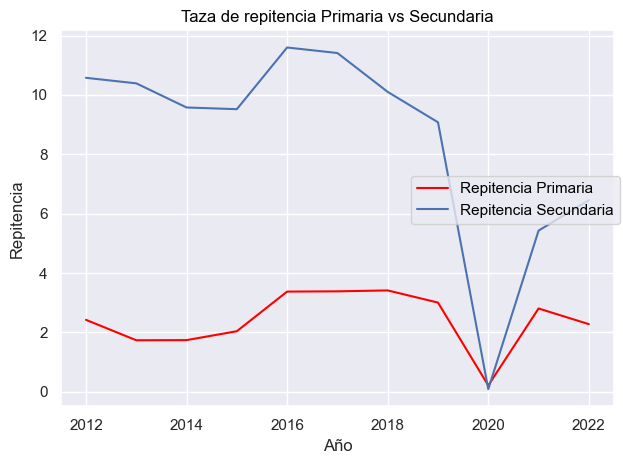

In [65]:
df_repitencias=df_educacion.groupby("anio")[["repitencia_primaria","repitencia_secundaria"]].mean()
(so.Plot()
    .add(so.Line(color="red"),data=df_repitencias,x="anio",y="repitencia_primaria",label="Repitencia Primaria")
    .add(so.Line(),data=df_repitencias,x="anio",y="repitencia_secundaria",label="Repitencia Secundaria")
    .label(title="Taza de repitencia Primaria vs Secundaria",x="Año",y="Repitencia")
).show()

In [66]:
zona_norte = ['San Isidro', 'Vicente Lopez', 'General San Martin', 'San Fernando', 'Tigre']
zona_oeste = ['Moron', 'Tres de Febrero', 'La Matanza', 'Merlo', 'Moreno']
zona_sur = ['Almirante Brown', 'Avellaneda', 'Quilmes', 'Lanus', 'Florencio Varela', 'Berazategui', 'Lomas de Zamora', 'Esteban Echeverria']

def determinar_zona(x):
    if x in zona_norte:
        return 'Norte'
    elif x in zona_oeste:
        return 'Oeste'
    elif x in zona_sur:
        return 'Sur'
    else:
        return 'Interior'

df_educacion["zona"]=df_educacion["municipio_nombre"].apply(determinar_zona)

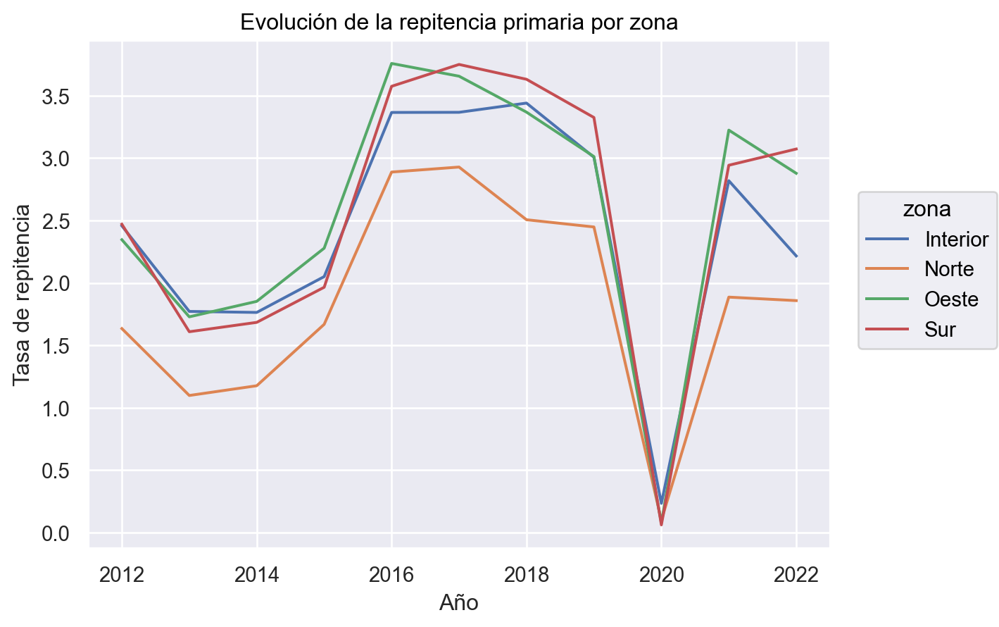

In [67]:
so.Plot(
        df_educacion.groupby(["anio","zona"])[["repitencia_primaria","repitencia_secundaria"]].mean(),
        x="anio",
        y="repitencia_primaria",
        color="zona"
    ).add(so.Lines()).label(title="Evolución de la repitencia primaria por zona",x="Año",y="Tasa de repitencia")

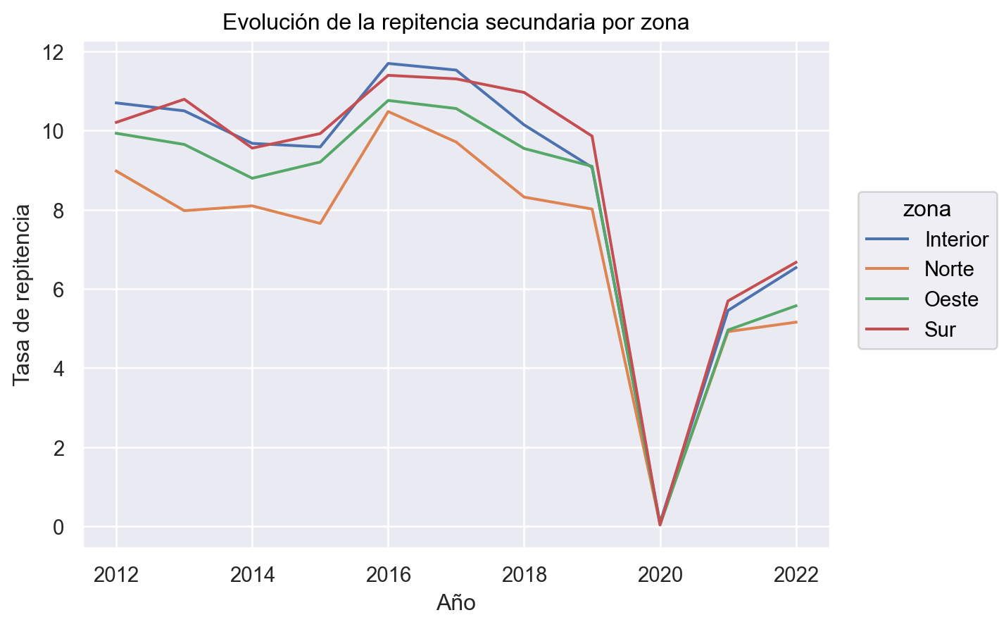

In [68]:
so.Plot(
        df_educacion.groupby(["anio","zona"])[["repitencia_primaria","repitencia_secundaria"]].mean(),
        x="anio",
        y="repitencia_secundaria",
        color="zona"
    ).add(so.Lines()).label(title="Evolución de la repitencia secundaria por zona",x="Año",y="Tasa de repitencia")

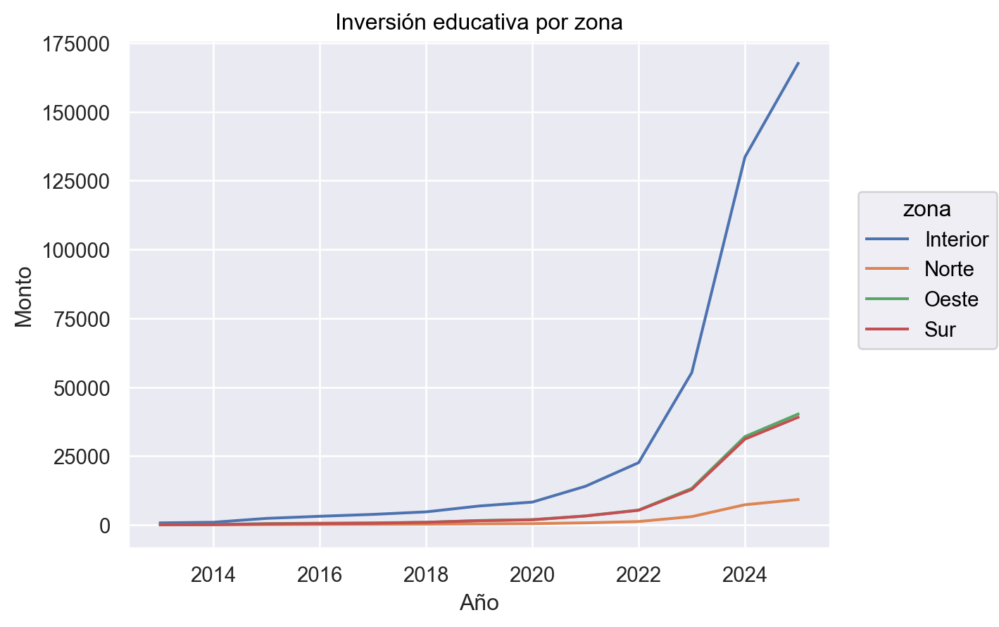

In [69]:
df_inversiones["zona"]=df_inversiones["municipio_nombre"].apply(determinar_zona)
df_inversiones["monto_millones"]=df_inversiones["monto"]/1_000_000

df_investigacion_inversion= df_inversiones[df_inversiones["concepto"]=='Fondo Financiamiento Educativo']

so.Plot(df_investigacion_inversion.groupby(["anio","zona"])["monto_millones"].sum().reset_index(),
        x="anio",
        y="monto_millones",
        color="zona").add(so.Lines()).label(title="Inversión educativa por zona",x="Año",y="Monto")

In [70]:
df_analisis_inversiones=df_inversiones[(df_inversiones["anio"]==2022) & (df_inversiones["concepto"]=="Fondo Financiamiento Educativo")].groupby(["anio","municipio_nombre"]).sum("monto_millones").reset_index()
df_analisis_inversiones.set_index("municipio_nombre",inplace=True)

df_poblacion_analisis=df_poblacion[["municipio_nombre","2022"]].dropna().set_index("municipio_nombre")

df_inversion_poblacion= pd.merge(df_analisis_inversiones,df_poblacion_analisis,left_index=True,right_index=True).reset_index()
df_inversion_poblacion.rename(columns={"2022":"poblacion"},inplace=True)

df_zonas=df_educacion.loc[df_educacion["anio"] == 2022, ["municipio_nombre", "zona"]].set_index("municipio_nombre")
df_inversion_poblacion=pd.merge(df_inversion_poblacion,df_zonas,left_on="municipio_nombre",right_index=True)

df_inversion_poblacion.reset_index(drop=True,inplace=True)
df_inversion_poblacion

,municipio_nombre,anio,mes,municipio_id,monto,monto_millones,poblacion,zona
0,25 de Mayo,2022,75,68540,1.642347e+08,164.234738,35563.0,Interior
1,9 de Julio,2022,68,52704,1.311927e+08,131.192669,52607.0,Interior
2,Adolfo Alsina,2022,75,60070,1.096465e+08,109.646511,17552.0,Interior
3,Adolfo Gonzales Chaves,2022,75,60140,8.337438e+07,83.374377,12914.0,Interior
4,Alberti,2022,75,60210,4.842338e+07,48.423383,12982.0,Interior
...,...,...,...,...,...,...,...,...
97,Tres Arroyos,2022,75,68330,2.040587e+08,204.058702,62426.0,Interior
98,Tres Lomas,2022,75,68470,4.448359e+07,44.483587,9164.0,Interior
99,Tres de Febrero,2022,75,68400,4.772444e+08,477.244409,364176.0,Oeste
100,Villa Gesell,2022,75,68680,7.824886e+07,78.248862,37463.0,Interior


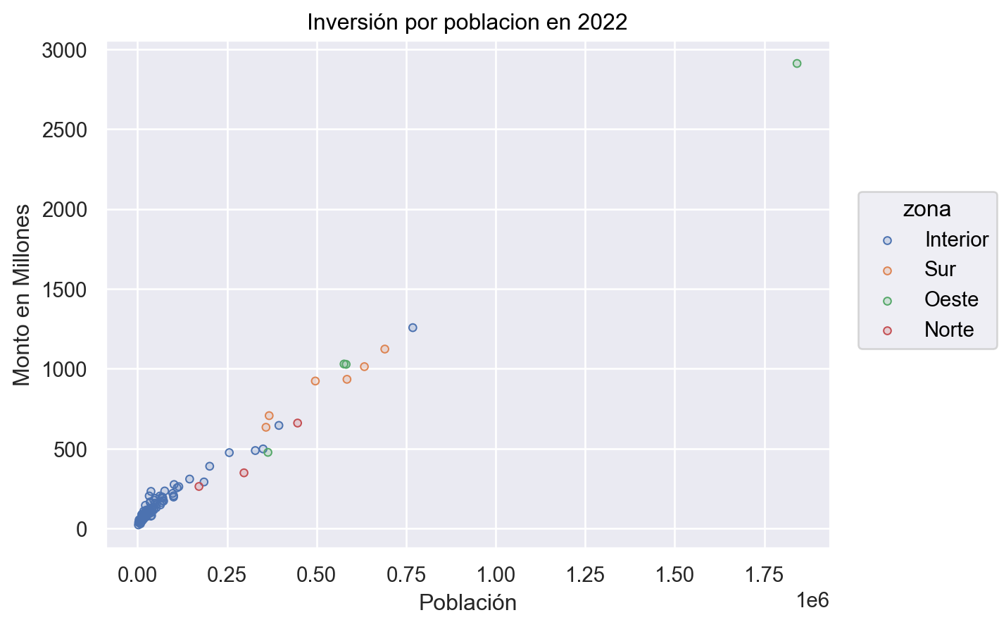

In [71]:
so.Plot(df_inversion_poblacion,
        x="poblacion",
        y="monto_millones",
        color="zona",).add(so.Dots(pointsize=4)).label(title="Inversión por poblacion en 2022",x="Población",y="Monto en Millones")

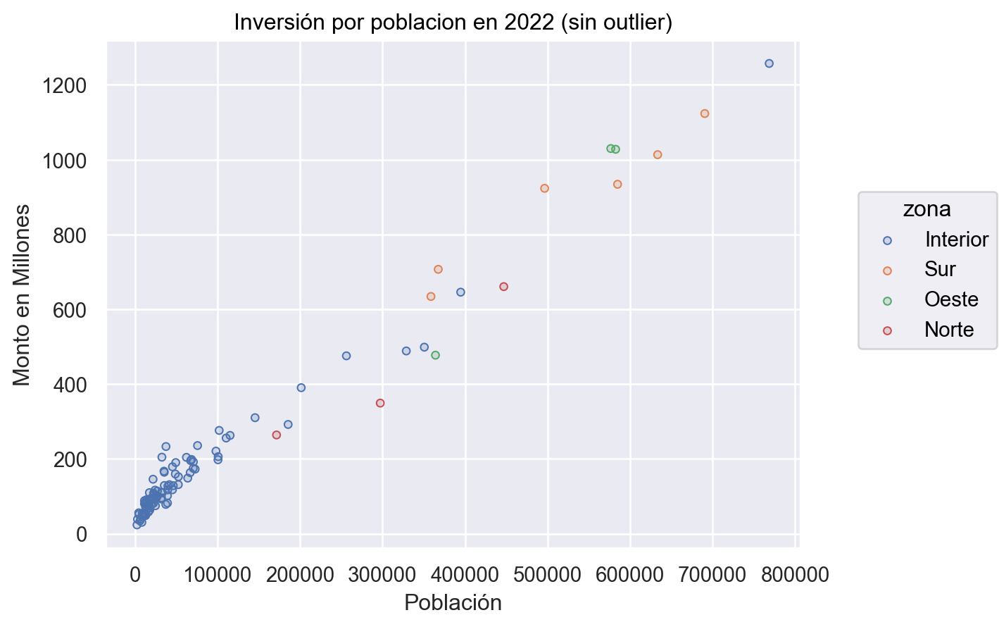

In [72]:
inversion_maxima=df_inversion_poblacion["monto_millones"].idxmax()

so.Plot(df_inversion_poblacion.drop(inversion_maxima),
        x="poblacion",
        y="monto_millones",
        color="zona",).add(so.Dots(pointsize=4)).label(title="Inversión por poblacion en 2022 (sin outlier)",x="Población",y="Monto en Millones")

In [73]:
df_analisis_colegio=df_colegios[df_colegios["nivel"]=="Nivel Secundario"].reset_index(drop=True)
df_analisis_colegio=df_analisis_colegio.groupby("municipio_nombre").size().reset_index(name="cantidad_colegios")
df_analisis_colegio.set_index("municipio_nombre",inplace=True)
df_inversion_poblacion=pd.merge(df_inversion_poblacion,df_analisis_colegio,left_on="municipio_nombre",right_index=True)

df_inversion_poblacion

,municipio_nombre,anio,mes,municipio_id,monto,monto_millones,poblacion,zona,cantidad_colegios
0,25 de Mayo,2022,75,68540,1.642347e+08,164.234738,35563.0,Interior,18
1,9 de Julio,2022,68,52704,1.311927e+08,131.192669,52607.0,Interior,24
2,Adolfo Alsina,2022,75,60070,1.096465e+08,109.646511,17552.0,Interior,14
3,Adolfo Gonzales Chaves,2022,75,60140,8.337438e+07,83.374377,12914.0,Interior,10
4,Alberti,2022,75,60210,4.842338e+07,48.423383,12982.0,Interior,9
...,...,...,...,...,...,...,...,...,...
97,Tres Arroyos,2022,75,68330,2.040587e+08,204.058702,62426.0,Interior,24
98,Tres Lomas,2022,75,68470,4.448359e+07,44.483587,9164.0,Interior,5
99,Tres de Febrero,2022,75,68400,4.772444e+08,477.244409,364176.0,Oeste,94
100,Villa Gesell,2022,75,68680,7.824886e+07,78.248862,37463.0,Interior,14


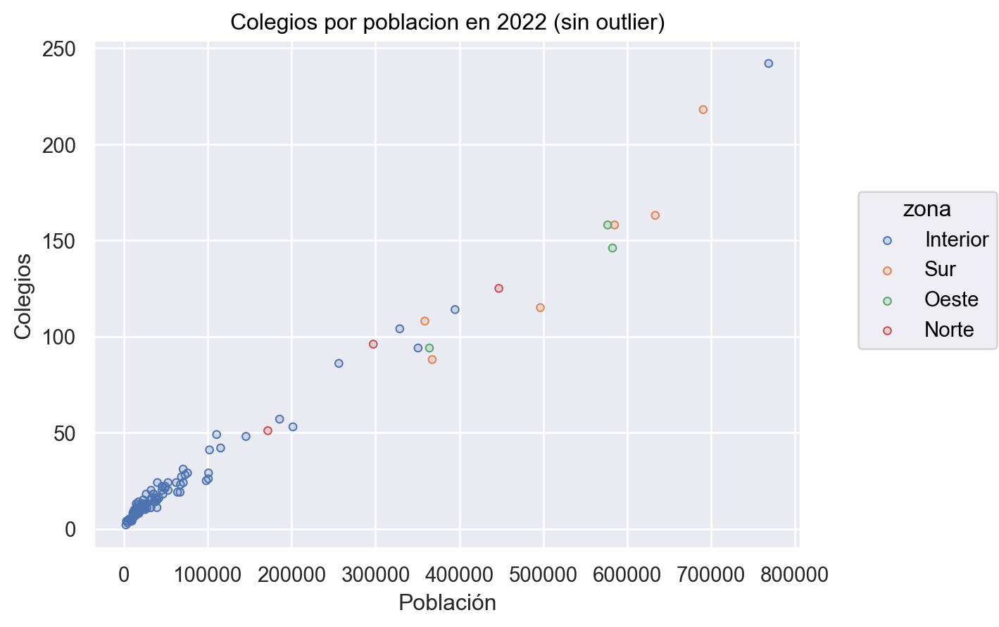

In [74]:
so.Plot(df_inversion_poblacion.drop(inversion_maxima),
        x="poblacion",
        y="cantidad_colegios",
        color="zona",).add(so.Dots(pointsize=4)).label(title="Colegios por poblacion en 2022 (sin outlier)",x="Población",y="Colegios")

In [75]:
geo_df.to_file('partidos_limpio.geojson')

geo_df["cde"]=geo_df["cde"].astype(int)

lezama_id=df_educacion[df_educacion["municipio_nombre"]=="Lezama"]["municipio_id"].iloc[0]
chascomus_id=df_educacion[df_educacion["municipio_nombre"]=="Chascomus"]["municipio_id"].iloc[0]

geo_df.loc[geo_df["nam"]=="Lezama","cde"]=lezama_id
geo_df.loc[geo_df["nam"]=="Chascomús","cde"]=chascomus_id

geo_df.to_file('partidos_limpio.geojson', driver='GeoJSON')
geo_df



,cca,cde,fna,gna,nam,sag,ara3,arl,geometry
0,045,6357,Partido de General Pueyrredón,Partido,General Pueyrredón,ARBA,1463.50,1460.74,"MULTIPOLYGON (((-57.54 -38.06, -57.53 -38.05, ..."
1,055,6441,Partido de La Plata,Partido,La Plata,ARBA,892.63,942.23,"MULTIPOLYGON (((-58.14 -34.99, -58.13 -35, -58..."
2,070,6427,Partido de La Matanza,Partido,La Matanza,ARBA,328.19,329.22,"MULTIPOLYGON (((-58.58 -34.65, -58.58 -34.65, ..."
3,030,6260,Partido de Esteban Echeverría,Partido,Esteban Echeverría,ARBA,120.45,120.22,"MULTIPOLYGON (((-58.51 -34.73, -58.51 -34.73, ..."
4,074,6560,Partido de Moreno,Partido,Moreno,ARBA,186.05,186.13,"MULTIPOLYGON (((-58.78 -34.56, -58.77 -34.56, ..."
...,...,...,...,...,...,...,...,...,...
138,132,6412,Partido de José C. Paz,Partido,José C. Paz,ARBA,50.01,50.16,"MULTIPOLYGON (((-58.81 -34.48, -58.81 -34.48, ..."
139,314,6126,Partido de Islas Campana,Partido,Islas Campana,ARBA,682.96,NaN,"MULTIPOLYGON (((-58.9 -33.96, -58.9 -33.96, -5..."
140,113,6182,Partido de Coronel Rosales,Partido,Coronel Rosales,ARBA,1283.36,1622.60,"MULTIPOLYGON (((-61.74 -38.63, -61.74 -38.63, ..."
141,357,6805,Partido de Islas Tigre,Partido,Islas Tigre,ARBA,280.36,NaN,"MULTIPOLYGON (((-58.65 -34.27, -58.64 -34.27, ..."


In [76]:
repit=df_educacion.groupby(['municipio_id', 'municipio_nombre'])[['repitencia_secundaria']].mean().reset_index()
repit.rename(columns={'municipio_id':'cde'},inplace=True)
repit

,cde,municipio_nombre,repitencia_secundaria
0,6007,Adolfo Alsina,5.600000
1,6014,Adolfo Gonzales Chaves,8.960000
2,6021,Alberti,7.790000
3,6028,Almirante Brown,8.197273
4,6035,Avellaneda,9.252727
...,...,...,...
130,6854,25 de Mayo,7.293636
131,6861,Vicente Lopez,5.488182
132,6868,Villa Gesell,7.985455
133,6875,Villarino,10.423636


In [77]:
with open('partidos_limpio.geojson', 'r') as f:
    partidos = json.load(f)
    
fig = px.choropleth_map(
    repit, 
    geojson=partidos, 
    featureidkey = 'properties.cde',
    locations='cde',
    color='repitencia_secundaria',
    hover_name='municipio_nombre',
    color_continuous_scale='Bluered',
    zoom = 4, 
    center = {"lat": -34.61315, "lon": -58.37723},
    opacity=0.7
)

fig.show()

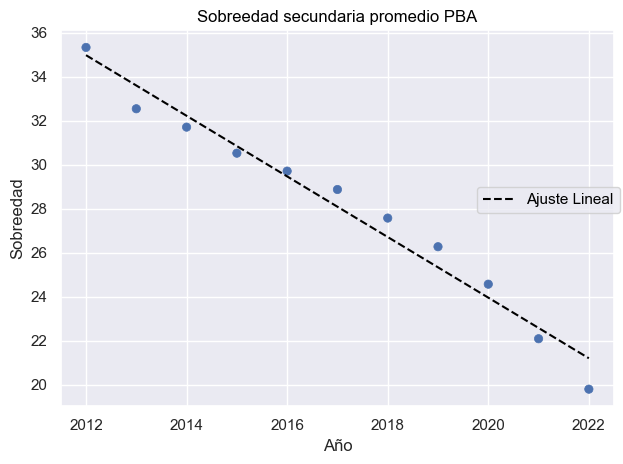

In [78]:
serie=df_educacion.groupby("anio")["sobreedad_secundaria"].mean()
df_comparacion=serie.reset_index()

y , X = Formula('sobreedad_secundaria ~ anio').get_model_matrix(df_comparacion) 
modelo=linear_model.LinearRegression(fit_intercept=False)
modelo.fit(X,y)

beta = modelo.coef_
beta_0 = beta[0][0]
beta_1 = beta[0][1]
df_comparacion["modelo_predict"]=beta_0 + df_comparacion["anio"] * beta_1

(
    so.Plot()
    .add(so.Dot(), data=df_comparacion, x="anio", y="sobreedad_secundaria")
    .add(so.Line(color="Black",linestyle='--'), data=df_comparacion, x="anio", y="modelo_predict", label="Ajuste Lineal")
    .label(title="Sobreedad secundaria promedio PBA", x="Año", y="Sobreedad")
).show()

In [79]:
df_agregar=df_educacion[df_educacion["anio"]==2022][["municipio_nombre","repitencia_secundaria","repitencia_primaria"]] #Creo el df que voy a agregar a mi df de investigacion
df_inversion_poblacion=pd.merge(df_inversion_poblacion,df_agregar,left_on="municipio_nombre",right_on="municipio_nombre")
df_inversion_poblacion

,municipio_nombre,anio,mes,municipio_id,monto,monto_millones,poblacion,zona,cantidad_colegios,repitencia_secundaria,repitencia_primaria
0,25 de Mayo,2022,75,68540,1.642347e+08,164.234738,35563.0,Interior,18,5.71,2.05
1,9 de Julio,2022,68,52704,1.311927e+08,131.192669,52607.0,Interior,24,6.51,1.59
2,Adolfo Alsina,2022,75,60070,1.096465e+08,109.646511,17552.0,Interior,14,5.77,3.01
3,Adolfo Gonzales Chaves,2022,75,60140,8.337438e+07,83.374377,12914.0,Interior,10,2.97,1.45
4,Alberti,2022,75,60210,4.842338e+07,48.423383,12982.0,Interior,9,4.83,3.88
...,...,...,...,...,...,...,...,...,...,...,...
97,Tres Arroyos,2022,75,68330,2.040587e+08,204.058702,62426.0,Interior,24,9.43,1.74
98,Tres Lomas,2022,75,68470,4.448359e+07,44.483587,9164.0,Interior,5,1.38,1.34
99,Tres de Febrero,2022,75,68400,4.772444e+08,477.244409,364176.0,Oeste,94,7.00,2.43
100,Villa Gesell,2022,75,68680,7.824886e+07,78.248862,37463.0,Interior,14,1.98,2.98
